# **Complete Procedure**
# Data Preprocessing

*   Checking whether GPU is activated or not.
*   Mounting Google Drive and changing directory inside to **MyDrive/**.
*   Changing Directoy to **ObjectDetection_EV/** and listing its content.
*   Creating directories

  `train/images`, `train/labels`, `val/images`, `val/labels`, `test/images`.
*   Installing necessary libraries
*   Defining **class names** and path to **.json** and **.jpg** files.
*   Calling function for reading **.json** file and corresponding **.jpg (image)** file and viewing the **bounding box** and **class names** on the images.
*   Converting **.json** annotations into **.txt** files for **YOLO**.
*   Preparing Dataset with "Train" and "Test" data with **images** and **labels** inside them with **80:20** split.
*   Adding **data.yaml** file with
      1. Train data path
      2. Validation data path
      3. Number of classes
      4. Class names
*   Deleting if any previously cloned **YOLO** repository available.
*   Cloning **Yolov5** from Github and changing directory inside **yolov5**.
*   Installing **requirements** and **file writing in cell magic function**.
*   Reading **Number of classes (nc)** from **data.yaml**
*   Checking for `models/custom_yolov5s.yaml`, if not present then creating from **touch** writing **Number of classes (nc)** into `models/custom_yolov5s.yaml` which will be **Yolov5 configuration file**.

# Training
*   Deleting **runs** directory if **exists** and **New Training** is there.
*   Running **train.py** for training.
*   Deleting **runs/detects/** inside files if they **exist** and **New Detection** is there.
*   Running **detect.py** for predicting for `val/images`
    1.   Bounding box
    2.   Class Name
    3. Confidence Score
*   Running function for reading **images with above data** from `runs/detect/exp/*`.
*   For Custom Images, upload them to test/images and run the code given same as **detect.py** and then Run the function for reading **images with above data** from `runs/detect/exp/*`.



# Data Preprocessing

Checking whether GPU is activated or not

In [ ]:
!nvidia-smi

Sat Jan 29 17:06:13 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.46       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Mounting Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')  

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Changing Directory to ObjectDetection_EV

In [ ]:
%cd "/content/drive/MyDrive/ObjectDetection_EV"  

/content/drive/MyDrive/ObjectDetection_EV


Listing files inside ObjectDetection_EV directory

In [ ]:
!ls

Person_Car_Detection.ipynb  trainval


Creating train test and val directories

In [ ]:
# Deleting any folder already available and creating new one --RUN-WITH-CAUTION


# !rm -rf train
# !mkdir -p train/images train/labels
# !rm -rf val
# !mkdir -p val/images val/labels
# !rm -rf test
# !mkdir -p test/images
# !ls


Person_Car_Detection.ipynb  test  train  trainval  val


In [ ]:
# Importing necessary libraries

import os
import cv2
import yaml
import json
import numpy as np
import tqdm.notebook as tq
from shutil import copyfile
from google.colab.patches import cv2_imshow
from sklearn.model_selection import train_test_split

In [ ]:
# Setting classNames and data path for Images and Annotation for just below cell

classes = ['person', 'car']
dataImgPath = '/content/drive/MyDrive/ObjectDetection_EV/trainval/images/'
dataAnnPath = '/content/drive/MyDrive/ObjectDetection_EV/trainval/annotations/bbox-annotations.json'

Testing bounding box on an image

In [ ]:
def bboxViewer(mode):
  '''
  Function: Reading json files in trainval/annotation directory and images from trainval/images directory creating bounding boxes on the images read
            (Running for 1 image, remove break at the end, and use slicing in first loop)
  Arguments: mode -- "club" corresponding to single image for all the bounding boxes inside it
                     "noclub" for one image per bounding box
  Output: Images with bounding boxes and corresponding classNames and bounding box coordinates
  '''
  images = os.listdir(dataImgPath)
  f = open(dataAnnPath)
  data = json.load(f)
  print(f"Classes 0 {data['categories'][0]['name']}\n\t\t1 {data['categories'][1]['name']}")
  anns = list(range(len(data["images"])))

  flag = mode

  for i in anns:
    w = data["images"][i]["width"]
    h = data["images"][i]["height"]
    imagepath = dataImgPath + data["images"][i]["file_name"]
    print("ImagePath", imagepath)
    image = cv2.imread(imagepath)
    dicty = {'person' : (0, 0, 255), 'car' : (255, 0, 0)}
    print("Person-RedBox, Car-BlueBox\n")
    objects = [data["annotations"][x] for x, _ in enumerate(data["annotations"]) if data["annotations"][x]["image_id"] == i]
    for obj in objects:
      if flag != 'club':
        image = cv2.imread(imagepath)
      cls = classes[obj["category_id"]-1]
      print("ClassName", cls)
      xmlbox = obj['bbox']
      xmlbox = [int(s) for s in xmlbox]
      print("Xmin, ymin, width, height", xmlbox)
      image = cv2.rectangle(image, (xmlbox[0], xmlbox[1]),  (xmlbox[0]+xmlbox[2], xmlbox[1]+xmlbox[3]), dicty[cls], 2)
      if flag != 'club':
        cv2_imshow(image)
        cv2.waitKey(1)
    if flag == 'club':
      cv2_imshow(image)
      cv2.waitKey(1)
    break
  f.close()


Classes 0 person
		1 car
ImagePath /content/drive/MyDrive/ObjectDetection_EV/trainval/images/image_000000001.jpg
Person-RedBox, Car-BlueBox

ClassName person
Xmin, ymin, width, height [846, 145, 146, 477]
ClassName person
Xmin, ymin, width, height [848, 216, 175, 551]
ClassName car
Xmin, ymin, width, height [74, 159, 75, 81]
ClassName car
Xmin, ymin, width, height [153, 124, 658, 643]


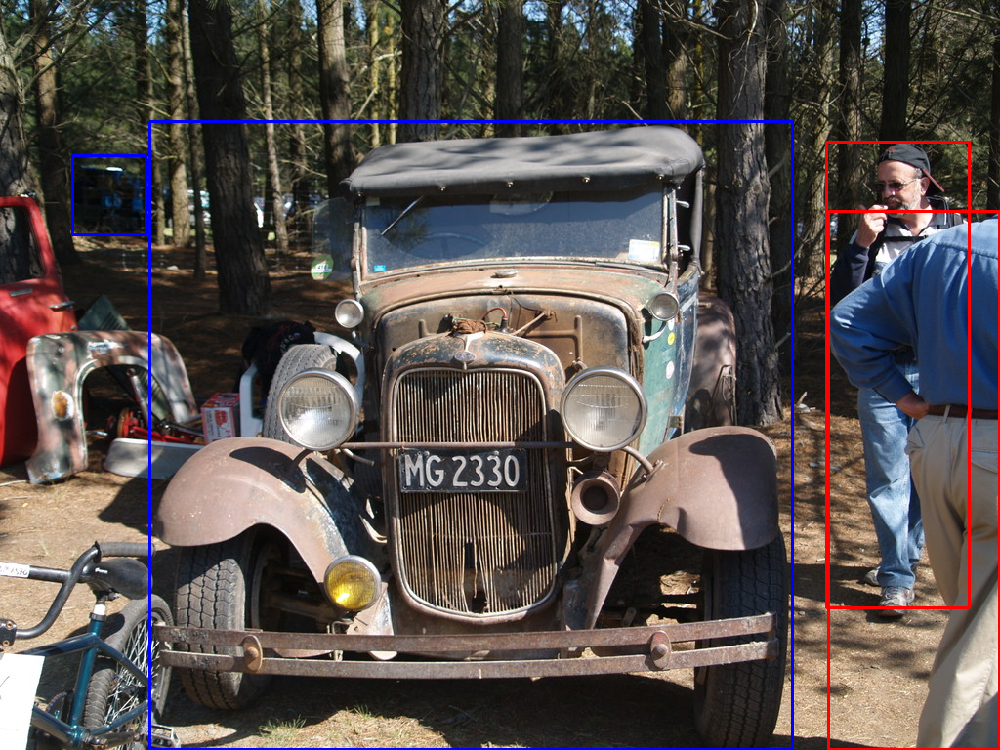

In [ ]:
# Calling above function


bboxViewer('club')

In [ ]:
trainMode = '/content/drive/MyDrive/ObjectDetection_EV/train/'
valMode = '/content/drive/MyDrive/ObjectDetection_EV/val/'

Converting json annotations to txt format

In [ ]:
def convert_annot(size , box):
  '''
  Function: Converting xmin, ymin, xmax, ymax -> xmin, ymin, width, height and rescaling them
  Arguments: size - list containing image width and image height, 
             box - list of classname, xmin, ymin, xmax, ymax 
  Return: list of [xcenter, ycenter, box-width, box-height] normalized
  '''
  x1 = int(box[0])
  y1 = int(box[1])
  x2 = int(box[2])
  y2 = int(box[3])

  dw = np.float32(1. / int(size[0]))
  dh = np.float32(1. / int(size[1]))

  w = x2 - x1
  h = y2 - y1
  x = x1 + (w / 2)
  y = y1 + (h / 2)

  x = x * dw
  w = w * dw
  y = y * dh
  h = h * dh
  return [x, y, w, h]

In [ ]:
def datasetMaker(pathDir, listy):
  '''
  Function: Reading train/ and val/ path and creating saving path for json and images files and creating yolo format .txt files from .json and copying
            respective images into train/images and val/images
  '''
  f = open(dataAnnPath)
  data = json.load(f)
  jsonPath = dataAnnPath
  for i in tq.tqdm(listy):
    image = [data["images"][x] for x, _ in enumerate(data["images"]) if data["images"][x]["id"] == i]
    imageName = image[0]["file_name"]
    imagePath = dataImgPath + imageName
    saveTxtPath = pathDir + "labels/" + imageName[:-4] + ".txt"
    saveImagePath = pathDir + "images/" + imageName
    img_w = image[0]["width"]
    img_h = image[0]["height"]
    size = [img_w, img_h]    
    img_box = []
    objects = [data["annotations"][x] for x, _ in enumerate(data["annotations"]) if data["annotations"][x]["image_id"] == i]
    for obj in objects:
      cls_name = classes[obj["category_id"]-1]
      xmlbox = obj['bbox']
      xmlbox = [int(s) for s in xmlbox]
      x1 = xmlbox[0]
      y1 = xmlbox[1]
      x2 = x1 + xmlbox[2]
      y2 = y1 + xmlbox[3]
      img_box.append([cls_name, x1, y1, x2, y2])
    with open(saveTxtPath ,'w+') as file_path:
      for box in img_box:
        cls_num = classes.index(box[0])
        new_box = convert_annot(size, box[1:])
        file_path.write(f"{cls_num} {new_box[0]} {new_box[1]} {new_box[2]} {new_box[3]}\n")
      file_path.flush()
      file_path.close()
    copyfile(imagePath, saveImagePath)
  f.close()

Splitting Dataset into train and val

In [ ]:
# Reading list of Images, Json and dividing Images into Train:Validation - 80:20   --RUN-WITH-CAUTION
# Calling Above function for Creating Dataset - train/images, train/labels, val/images, val/labels 

# images = os.listdir(dataImgPath)
# f = open(dataAnnPath)
# data = json.load(f)
# anns = list(range(len(data["images"])))
# f.close()
# train_list, val_list = train_test_split(anns, test_size=0.2, random_state=42)
# datasetMaker(trainMode, train_list)
# datasetMaker(valMode, val_list)

  0%|          | 0/1791 [00:00<?, ?it/s]

  0%|          | 0/448 [00:00<?, ?it/s]

Checking present working directory

In [ ]:
!pwd

/content/drive/MyDrive/ObjectDetection_EV


# Creating .yaml file

In [ ]:
# Creating "data.yaml" file --RUN-WITH-CAUTION

import yaml
dict_file = {'train': trainMode + 'images' ,
            'val': valMode + 'images',
            'nc' : 2,
            'names' : ['person', 'car']}

with open('/content/drive/MyDrive/ObjectDetection_EV/data.yaml', 'w+') as file:
    documents = yaml.dump(dict_file, file)

In [ ]:
!ls

data.yaml  Person_Car_Detection.ipynb  test  train  trainval  val


# Cloning Yolov5

In [ ]:
#Cloning Yolov5 --RUN-WITH-CAUTION

!git clone https://github.com/ultralytics/yolov5 

Cloning into 'yolov5'...
remote: Enumerating objects: 10740, done.
remote: Total 10740 (delta 0), reused 0 (delta 0), pack-reused 10740
Receiving objects: 100% (10740/10740), 10.83 MiB | 9.57 MiB/s, done.
Resolving deltas: 100% (7427/7427), done.


In [ ]:
#Changing Directory to yolov5 and installing the requirements required 

%cd /content/drive/My Drive/ObjectDetection_EV/yolov5/

!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

# !pip install utils
from IPython.display import Image, clear_output  # to display images
# from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

/content/drive/My Drive/ObjectDetection_EV/yolov5
     |████████████████████████████████| 596 kB 4.5 MB/s 
Setup complete. Using torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
# Magic Python function for writing to files within cell


from IPython.core.magic import register_line_cell_magic
@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
# Reading num_classes from "data.yaml"

import yaml
with open("/content/drive/MyDrive/ObjectDetection_EV/data.yaml", 'r') as stream:
    num_classes = yaml.safe_load(stream)['nc']
    print(num_classes)

2


In [ ]:
!pwd

/content/drive/MyDrive/ObjectDetection_EV/yolov5


In [ ]:
#Checking yolov5s custom yaml configuration file exists or not


!test -f "models/customized_yolov5s.yaml" && echo "File 'models/customized_yolov5s.yaml' exists." || echo "No Such File.."

No Such File..


In [ ]:
#Creating file using touch command

!touch models/customized_yolov5s.yaml

In [ ]:
# Adding {num_classes} to customized_yolov5s.yaml --RUN-WITH-CAUTION


# %%writetemplate /content/drive/MyDrive/ObjectDetection_EV/yolov5/models/customized_yolov5s.yaml

# # parameters
# nc: {num_classes}  # number of classes
# depth_multiple: 0.33  # model depth multiple
# width_multiple: 0.50  # layer channel multiple

# # anchors
# anchors:
#   - [10,13, 16,30, 33,23]  # P3/8
#   - [30,61, 62,45, 59,119]  # P4/16
#   - [116,90, 156,198, 373,326]  # P5/32

# # YOLOv5 backbone
# backbone:
#   # [from, number, module, args]
#   [[-1, 1, Focus, [64, 3]],  # 0-P1/2
#    [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
#    [-1, 3, BottleneckCSP, [128]],
#    [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
#    [-1, 9, BottleneckCSP, [256]],
#    [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
#    [-1, 9, BottleneckCSP, [512]],
#    [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
#    [-1, 1, SPP, [1024, [5, 9, 13]]],
#    [-1, 3, BottleneckCSP, [1024, False]],  # 9
#   ]

# # YOLOv5 head
# head:
#   [[-1, 1, Conv, [512, 1, 1]],
#    [-1, 1, nn.Upsample, [None, 2, 'nearest']],
#    [[-1, 6], 1, Concat, [1]],  # cat backbone P4
#    [-1, 3, BottleneckCSP, [512, False]],  # 13

#    [-1, 1, Conv, [256, 1, 1]],
#    [-1, 1, nn.Upsample, [None, 2, 'nearest']],
#    [[-1, 4], 1, Concat, [1]],  # cat backbone P3
#    [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

#    [-1, 1, Conv, [256, 3, 2]],
#    [[-1, 14], 1, Concat, [1]],  # cat head P4
#    [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

#    [-1, 1, Conv, [512, 3, 2]],
#    [[-1, 10], 1, Concat, [1]],  # cat head P5
#    [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

#    [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
#   ]

# Training

In [ ]:
# Changing present Directory to "yolov5" --RUN-WITH-CAUTION
# Deleting any pre-trained files or data available 

%cd /content/drive/MyDrive/ObjectDetection_EV/yolov5
!rm -rf runs

/content/drive/My Drive/ObjectDetection_EV/yolov5


If Running multiple times the Below Training code, without running the above code (for deleting "runs" directory), new folders would be created by the name `runs/train/yolov5s_results`, `runs/train/yolov5s_results2`, `runs/train/yolov5s_results3`. Add them before running **Detect.py**.

In [ ]:
# Timing the train process --RUN-WITH-CAUTION
# Changing present Directory to "yolov5"
# Running train.py with imagesize-416, batchsize-32, epochs-60, data-data.yaml, 
# cfg-customized_yolov5s.yaml configuration file path, weights-yolov5s.pt(to be downloaded), name-folderName to be saved, --cache-to cache the images in folder 

%%time
%cd /content/drive/MyDrive/ObjectDetection_EV/yolov5
!python train.py --img 416 --batch 32 --epochs 60 --data /content/drive/MyDrive/ObjectDetection_EV/data.yaml --cfg /content/drive/MyDrive/ObjectDetection_EV/yolov5/models/customized_yolov5s.yaml --weights yolov5s.pt --name yolov5s_results --cache

/content/drive/My Drive/ObjectDetection_EV/yolov5
train: weights=yolov5s.pt, cfg=/content/drive/MyDrive/ObjectDetection_EV/yolov5/models/customized_yolov5s.yaml, data=/content/drive/MyDrive/ObjectDetection_EV/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=60, batch_size=32, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-218-g7539cd7 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmu

If Running the below Code for multiple Times, new **experiments folders** would be created like `runs/detect/exp`, `runs/detect/exp1`, `runs/detect/exp2` etc. If want to run fresh experiments delete anything inside **runs/detect/**.


In [ ]:
# Changing present Directory to "yolov5" --RUN-WITH-CAUTION
# deleting files inside /runs/detect/

# !rm -rf /runs/detect/*

In [ ]:
!pwd

/content/drive/My Drive/ObjectDetection_EV/yolov5


For Detecting new images {Follow code available above for "test/images/"} and run the code for requirements then copy the images.zip into /content/drive/MyDrive/ObjectDetection_EV/test/images unzip it, then delete the zip file and run the below code.

In [ ]:
# Changing present Directory to "yolov5" --RUN-WITH-CAUTION
# Running detect.py with best save weights in yolov5s results, imagesize-416, confidenceScoreHigherThan-0.4, dataSource-/test/images,

%cd /content/drive/MyDrive/ObjectDetection_EV/yolov5
!python detect.py --weights /content/drive/MyDrive/ObjectDetection_EV/yolov5/runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source /content/drive/MyDrive/ObjectDetection_EV/val/images

/content/drive/My Drive/ObjectDetection_EV/yolov5
detect: weights=['/content/drive/MyDrive/ObjectDetection_EV/yolov5/runs/train/yolov5s_results/weights/best.pt'], source=/content/drive/MyDrive/ObjectDetection_EV/val/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-218-g7539cd7 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 232 layers, 7249215 parameters, 0 gradients, 16.8 GFLOPs
image 1/448 /content/drive/MyDrive/ObjectDetection_EV/val/images/image_000000014.jpg: 256x416 1 person, 2 cars, Done. (0.017s)
image 2/448 /content/drive/MyDrive/ObjectDetection_EV/val/images/image_000000019.jpg: 320x416 3 persons,

Displaying images with predictions.
**Results** are stored in /runs/detect/exp inside yolov5 folder.

/content/drive/My Drive/ObjectDetection_EV/yolov5


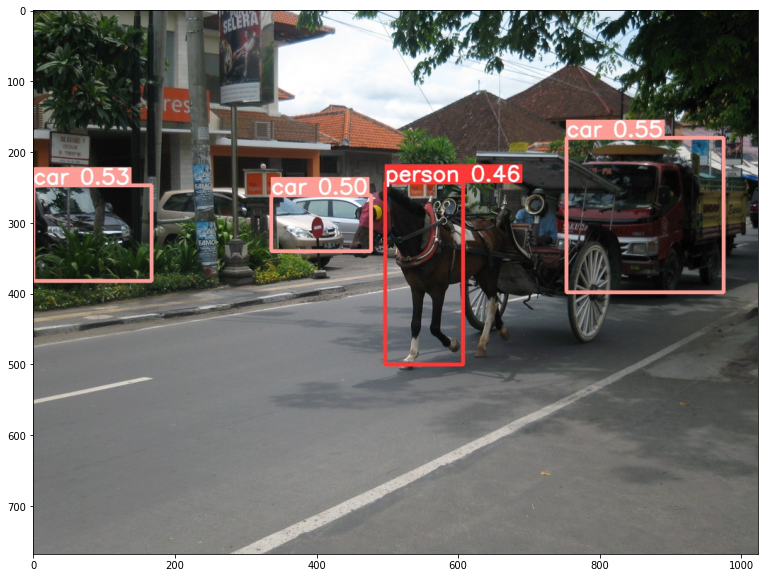

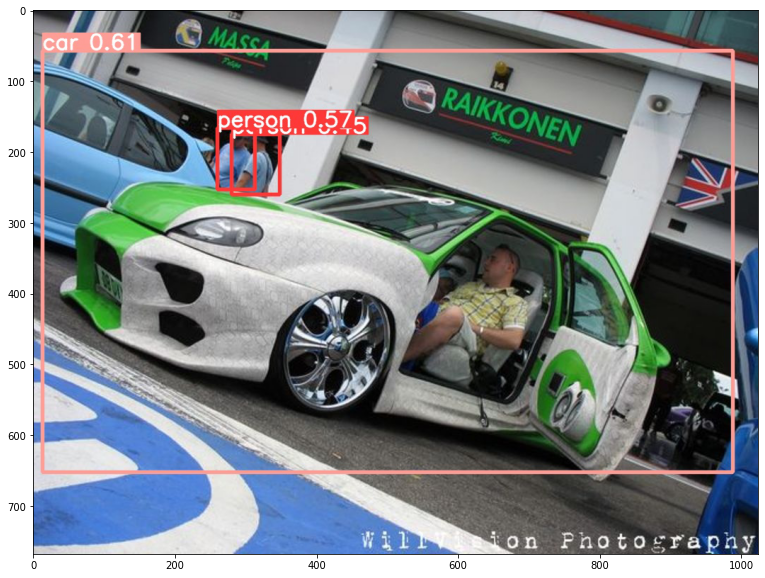

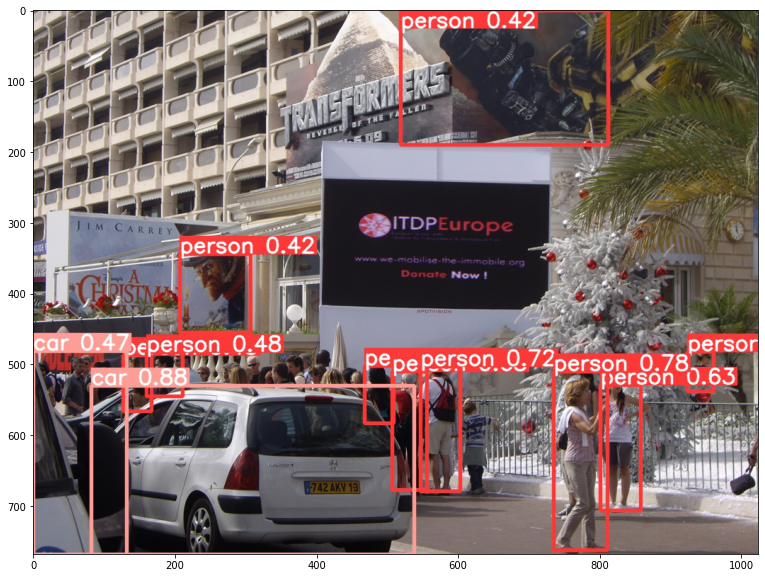

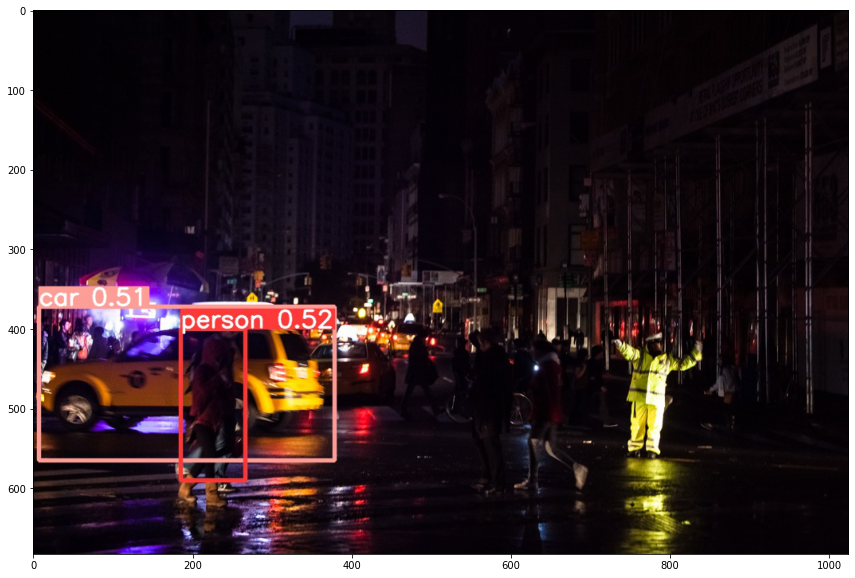

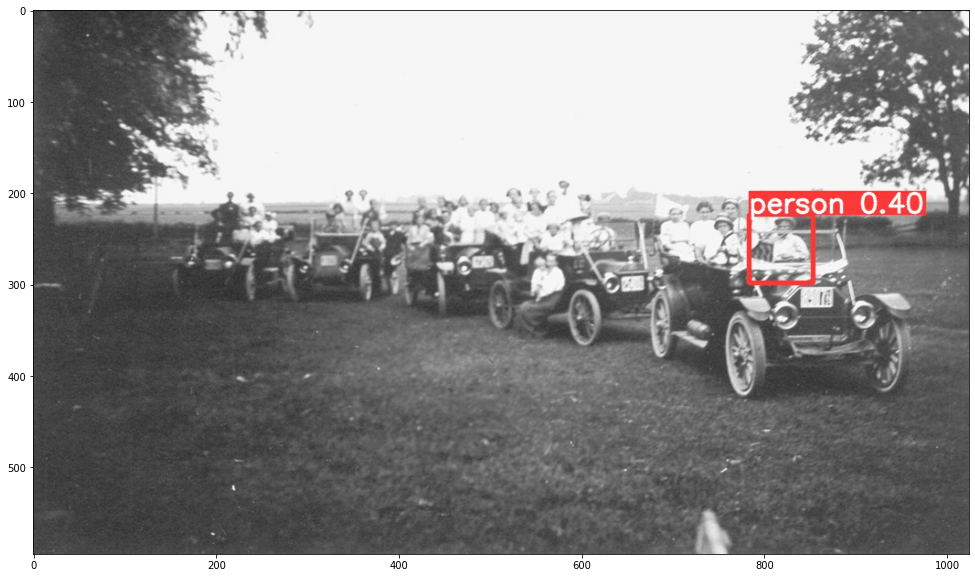

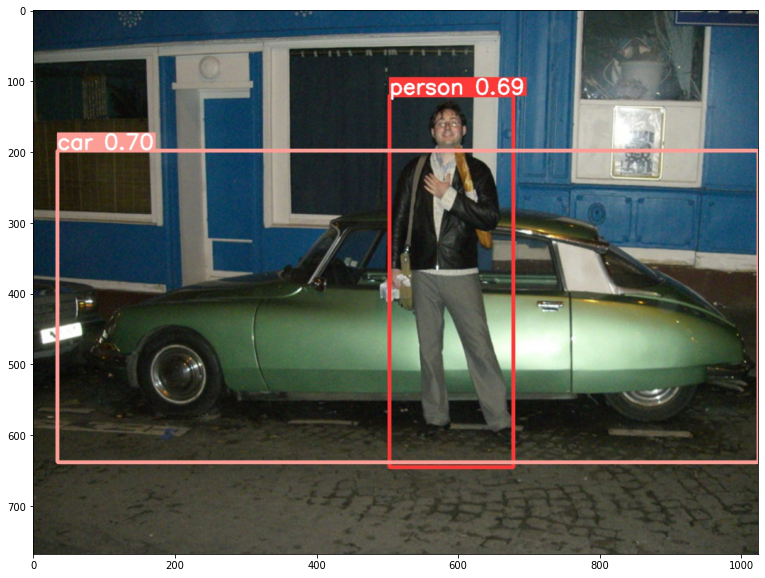

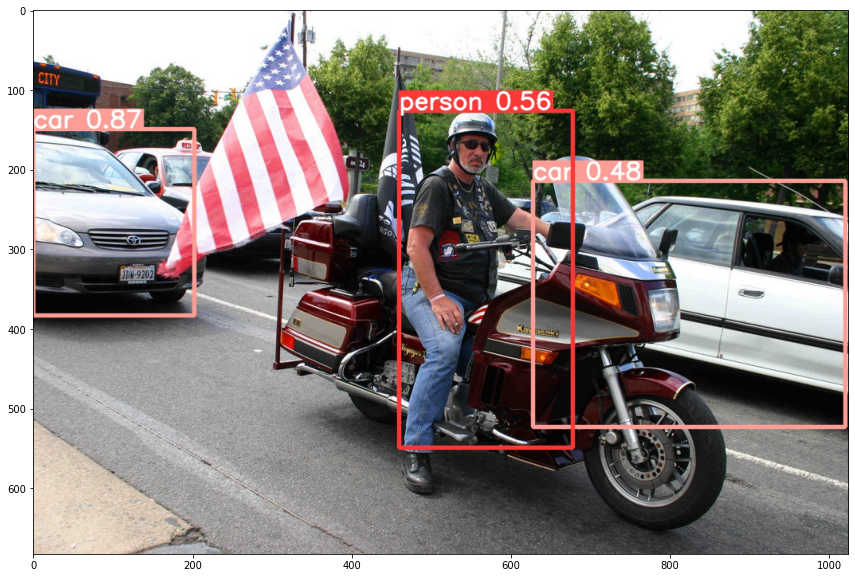

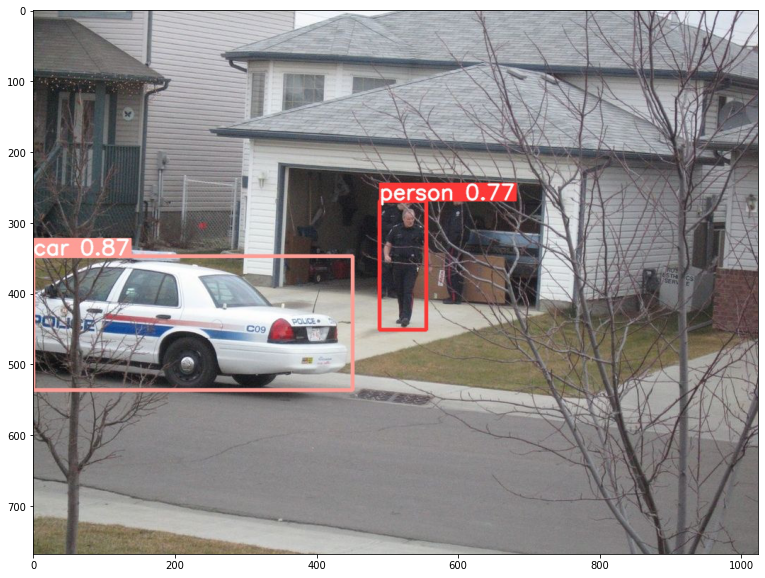

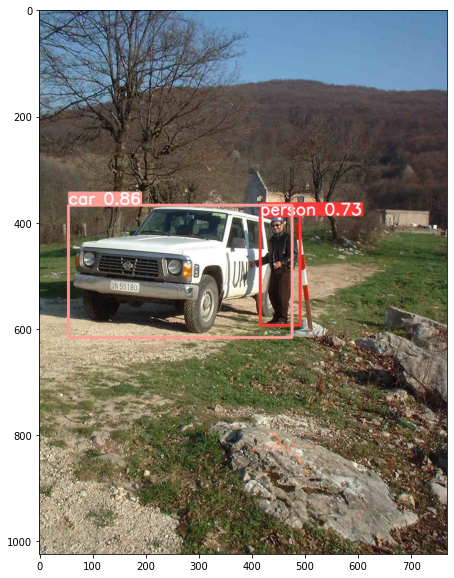

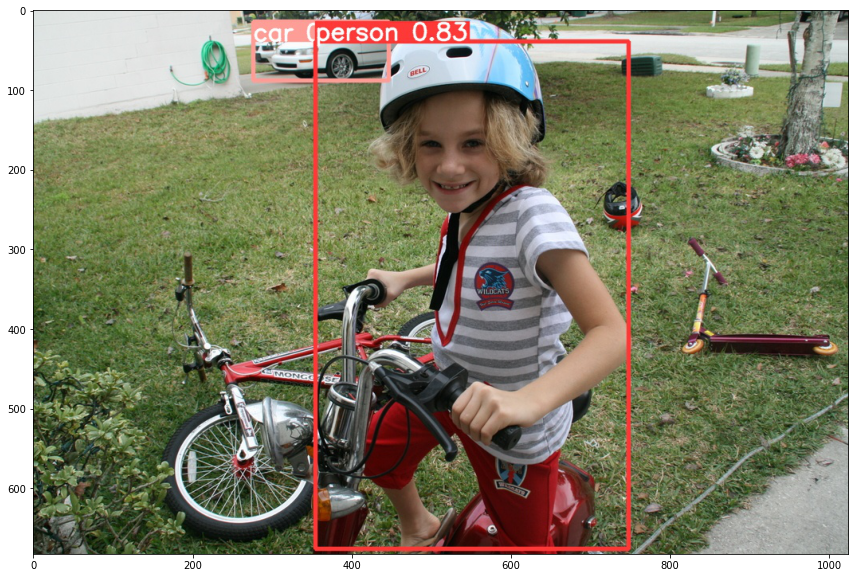

In [ ]:
# display detected images with bounding box, class name and confidence score,  with experiment stored in /runs/detect/exp
# change path if above new path generated while detecting as per new experiments.

%cd /content/drive/MyDrive/ObjectDetection_EV/yolov5

path0 = 'runs/detect/exp/*'

from IPython.display import Image
from glob import glob
import matplotlib.pyplot as plt
testfiles = glob(path0)

for i in testfiles[10:20]:
  plt.rcParams["figure.figsize"] = (30,10)
  img = plt.imread(i) 
  plt.imshow(img)    
  plt.show()

# For testing Custom images, put the images into /content/drive/MyDrive/ObjectDetection_EV/test/images Directory and run the below code. Also note down the directory in which images are stored?

In [ ]:
# Changing present Directory to "yolov5" --RUN-WITH-CAUTION
# Running detect.py with best save weights in yolov5s results, imagesize-416, confidenceScoreHigherThan-0.4, dataSource-/test/images,

%cd /content/drive/MyDrive/ObjectDetection_EV/yolov5
!python detect.py --weights /content/drive/MyDrive/ObjectDetection_EV/yolov5/runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source /content/drive/MyDrive/ObjectDetection_EV/test/images

In [ ]:
# display detected images with bounding box, class name and confidence score,  with experiment stored in /runs/detect/exp
# change the path

path1 = 'runs/detect/exp/*'



from IPython.display import Image
from glob import glob
import matplotlib.pyplot as plt
testfiles = glob(path1)

for i in testfiles:
  plt.rcParams["figure.figsize"] = (30,10)
  img = plt.imread(i) 
  plt.imshow(img)    
  plt.show()